In [ ]:
import pickle 
# import os

import numpy as np

import matplotlib.pyplot as plt

from loco_mujoco.evaluation.evaluation_prosthesis import PostProcessMetricsHandler
import importlib

postprocess_handler = PostProcessMetricsHandler()

# importlib.reload(importlib.import_module("evaluation_prosthesis"))

# postprocess_handler = PostProcessMetricsHandler()

min_walk_step_length = 60 # based on testing with initial data

In [ ]:
# Read all traj data from file
# file_name = "/home/nadinebadie/loco-mujoco/prosthesis_test/all_trajs_walk_SkeletonMuscle.pkl"
# # Load data from file_name: 
# with open(file_name, "rb") as f:
#     all_trajs = pickle.load(f)
#     # print(f"Loaded data: {all_trajs[0]}")

In [ ]:
# # Get joint names from the first trajectory's info
# joint_names = all_trajs[0].info.joint_names
# print("Joint names:", joint_names)
# qpos = all_trajs[0].data.qpos
# baseline_joint_names = ['hip_flexion', 'knee_angle', 'ankle_angle', 'subtalar_angle', 'mtp_angle']



# # Find indices for each joint with side suffix (_l or _r)
# joint_indices = {}
# for name in baseline_joint_names:
#     for suffix in ['_r']: #['_l', '_r']:
#         joint_full_name = f"{name}{suffix}"
#         if joint_full_name in joint_names:
#             joint_indices[joint_full_name] = joint_names.index(joint_full_name)

# # Extract qpos and qvel for each joint with side
# qvel = all_trajs[0].data.qvel
# joint_data_baseline_all = {}
# joint_data_baseline = {}
# for joint_full_name, idx in joint_indices.items():
#     joint_data_baseline[joint_full_name] = {
#         'angle': qpos[:, idx+6],
#         'velocity': qvel[:, idx+6]
#     }
#     joint_data_baseline_all[joint_full_name] = {
#         'angle': qpos[:, idx+6],
#         'velocity': qvel[:, idx+6]
#     }

# print("Joint data (qpos/qvel) for baseline joints with side (_l/_r):")
# for joint_full_name in joint_data_baseline_all:
#     print(f"{joint_full_name}: qpos shape {joint_data_baseline_all[joint_full_name]['angle'].shape}, qvel shape {joint_data_baseline_all[joint_full_name]['velocity'].shape}")


# # plot hip flexion for left and right
# plt.figure(figsize=(10, 5))
# # plt.plot(qpos[0:500,7], label='qpos')
# # plt.plot(qpos[0:500,12], label='qpos')
# plt.plot(joint_data_baseline_all['hip_flexion_r']['angle'][117:240], label='Left Hip Flexion')
# # plt.plot(joint_data_baseline['hip_flexion_l']['angle'][0:500], label='Right Hip Flexion')
# plt.plot(joint_data_baseline_all['knee_angle_r']['angle'][117:240], label='Left Knee flexion')#
# # # plt.plot(joint_data_baseline['knee_angle_l']['angle'][0:500], label='Right Knee flexion')
# plt.plot(joint_data_baseline_all['ankle_angle_r']['angle'][117:240], label='Left Ankle flexion')
# # plt.plot(joint_data_baseline['ankle_angle_l']['angle'][0:500], label='Right Ankle flexion')
# plt.title('Hip Flexion (Left vs Right)')

# # The original line is not correct and will raise an error.
# # If you want to slice all joint angle/velocity arrays for the baseline joints to [117:240], do this:
# for joint_full_name in joint_data_baseline_all:
#     # Interpolate to length 100 before setting
#     angle = joint_data_baseline_all[joint_full_name]['angle'][105:228]* 180 / np.pi  # Convert radians to degrees
#     velocity = joint_data_baseline_all[joint_full_name]['velocity'][105:228]* 180 / np.pi  # Convert radians to degrees
#     x_old = np.linspace(0, 1, len(angle))
#     x_new = np.linspace(0, 1, 100)
#     joint_data_baseline[joint_full_name]['angle'] = np.interp(x_new, x_old, angle)
#     joint_data_baseline[joint_full_name]['velocity'] = np.interp(x_new, x_old, velocity)

# # save joint_data_baseline to a file
# with open("/home/nadinebadie/loco-mujoco/prosthesis_test/joint_data_walk_SkeletonMuscle.pkl", "wb") as f:
#     pickle.dump(joint_data_baseline, f)

# Only read joint data from file
with open("/home/nadinebadie/loco-mujoco/prosthesis_evaluation/joint_data_walk_SkeletonMuscle.pkl", "rb") as f:
    joint_data_baseline = pickle.load(f)


# Compare different Runs 


First load all data from different files

In [22]:
# Define a mapping from variable names to output paths
run_names = {
    # 'no_joint': "/home/nadinebadie/loco-mujoco/prosthesis_test/outputs/2025-06-07/02-31-13/20250623_122452_evaluation_results_1000steps.pkl",
    # 'stiff100_damp10': "/home/nadinebadie/loco-mujoco/prosthesis_test/outputs/2025-06-10/02-14-59/20250623_121345_evaluation_results_1000steps.pkl",
    # 'stiff100_damp1': "/home/nadinebadie/loco-mujoco/prosthesis_test/outputs/2025-06-10/19-06-15/20250623_120215_evaluation_results_1000steps.pkl", 
    # 'stiff50_damp1': "/home/nadinebadie/loco-mujoco/prosthesis_test/outputs/2025-06-11/16-30-59/20250623_115044_evaluation_results_1000steps.pkl" 


    'no_joint': "/home/nadinebadie/loco-mujoco/prosthesis_test/outputs/2025-06-07/02-31-13/20250625_145210_evaluation_results_1000steps.pkl",
    'stiff100_damp10': "/home/nadinebadie/loco-mujoco/prosthesis_test/outputs/2025-06-10/02-14-59/20250625_144301_evaluation_results_1000steps.pkl",
    # 'stiff100_damp1': "/home/nadinebadie/loco-mujoco/prosthesis_test/outputs/2025-06-10/19-06-15/20250625_143250_evaluation_results_1000steps.pkl", 
    'stiff50_damp1': "/home/nadinebadie/loco-mujoco/prosthesis_test/outputs/2025-06-11/16-30-59/20250625_140700_evaluation_results_1000steps.pkl", 

    '0rad': "/home/nadinebadie/loco-mujoco/prosthesis_randomization/outputs/2025-06-23/16-37-56/20250626_102201_evaluation_results_1000steps_0prosthesis_body_orientation.pkl",
    '0.1rad': "/home/nadinebadie/loco-mujoco/prosthesis_randomization/outputs/2025-06-23/16-37-56/20250626_103019_evaluation_results_1000steps_100prosthesis_body_orientation.pkl",
    '0.2rad': "/home/nadinebadie/loco-mujoco/prosthesis_randomization/outputs/2025-06-23/16-37-56/20250626_103843_evaluation_results_1000steps_200prosthesis_body_orientation.pkl" ,
    '0.4rad': "/home/nadinebadie/loco-mujoco/prosthesis_randomization/outputs/2025-06-23/16-37-56/20250626_130636_evaluation_results_1000steps_400prosthesis_body_orientation.pkl" 
    # Add more as needed
}

# Dictionary to hold loaded data
all_loaded_data = {}

for var_name, path in run_names.items():
    with open(path, "rb") as f:
        loaded_data = pickle.load(f)
        print(f"Loaded data for {var_name} from {path}: {loaded_data.keys()}")
        all_loaded_data[var_name] = loaded_data





Loaded data for no_joint from /home/nadinebadie/loco-mujoco/prosthesis_test/outputs/2025-06-07/02-31-13/20250625_145210_evaluation_results_1000steps.pkl: dict_keys(['total_steps', 'n_envs', 'all_grf_l', 'all_grf_r', 'all_foot_ground_contact_left', 'all_foot_ground_contact_right', 'all_sensor_force', 'sensor_force_names', 'sum_step_activations', 'step_norm_activations', 'sum_muscles_activations', 'step_muscles_norm_activations', 'step_num_norm_activations', 'evaluation_muscle_groups', 'evaluation_joint_names', 'evaluation_muscle_names', 'all_actions', 'all_actuator_names', 'root_angle', 'root_velocity', 'root_forces_constraint', 'root_forces_smooth', 'root_torques', 'root_energy_exp', 'root_angle_per_step_left', 'root_angle_per_step_right', 'root_velocity_per_step_left', 'root_velocity_per_step_right', 'root_forces_constraint_per_step_left', 'root_forces_constraint_per_step_right', 'root_forces_smooth_per_step_left', 'root_forces_smooth_per_step_right', 'root_torques_per_step_left', 'ro

In [23]:
# Extract and process step data for each run
run_step_data = {}

for run_key, run_dict in all_loaded_data.items():
    all_foot_ground_contact_left = run_dict.get("all_foot_ground_contact_left", [])
    all_foot_ground_contact_right = run_dict.get("all_foot_ground_contact_right", [])

    filtered_left = [contact for contact in all_foot_ground_contact_left if contact != []]
    filtered_right = [contact for contact in all_foot_ground_contact_right if contact != []]

    if filtered_left:
        step_start_left = postprocess_handler.get_start_steps(filtered_left, min_walk_step_length)
    else:
        step_start_left = []

    if filtered_right:
        step_start_right = postprocess_handler.get_start_steps(filtered_right, min_walk_step_length)
    else:
        step_start_right = []

    run_step_data[run_key] = {
        "filtered_left": filtered_left,
        "filtered_right": filtered_right,
        "step_start_left": step_start_left,
        "step_start_right": step_start_right,
    }

    print(f"Run {run_key}:")
    print(f"  Filtered left foot ground contact: {filtered_left}")
    print(f"  Filtered right foot ground contact: {filtered_right}")
    print(f"  All step start left: {step_start_left}")
    print(f"  All step start right: {step_start_right}")



Run no_joint:
  Filtered left foot ground contact: [22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 78, 138, 139, 140, 141, 142, 143, 144, 145, 146, 147, 148, 149, 150, 151, 152, 153, 154, 155, 156, 157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168, 169, 170, 171, 172, 173, 174, 175, 176, 177, 178, 179, 180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192, 193, 194, 195, 196, 197, 198, 199, 254, 255, 256, 257, 258, 259, 260, 261, 262, 263, 264, 265, 266, 267, 268, 269, 270, 271, 272, 273, 274, 275, 276, 277, 278, 279, 280, 281, 282, 283, 284, 285, 286, 287, 288, 289, 290, 291, 292, 293, 294, 295, 296, 297, 298, 299, 300, 301, 302, 303, 304, 305, 306, 307, 308, 309, 310, 311, 312, 364, 365, 366, 367, 368, 369, 370, 371, 372, 373, 374, 375, 376, 377, 378, 379, 380, 381, 382, 383, 384, 385, 386, 387,

Step Length 

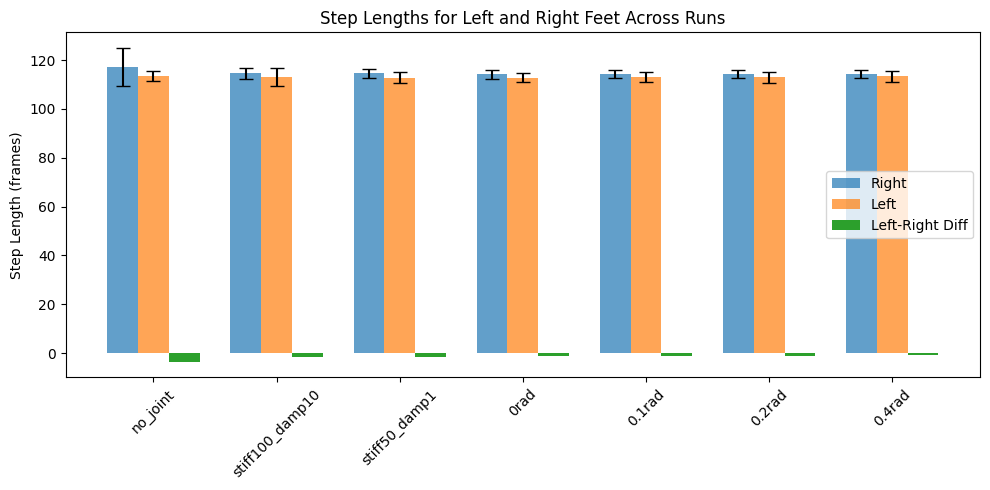

In [24]:
# Compare step lengths for left and right feet across runs in bar plots (Right, Left, difference left-right)
labels = []
right_means = []
right_stds = []
left_means = []
left_stds = []
diffs = []

for run_key in all_loaded_data.keys():
    step_start_right = run_step_data[run_key]["step_start_right"]
    step_start_left = run_step_data[run_key]["step_start_left"]
    step_numbers = min(len(step_start_right), len(step_start_left)) - 1
    if step_numbers < 1:
        continue
    step_length_right = np.array([step_start_right[m+1] - step_start_right[m] for m in range(step_numbers)])
    step_length_left = np.array([step_start_left[m+1] - step_start_left[m] for m in range(step_numbers)])
    right_means.append(np.mean(step_length_right))
    right_stds.append(np.std(step_length_right))
    left_means.append(np.mean(step_length_left))
    left_stds.append(np.std(step_length_left))
    diffs.append(np.mean(step_length_left) - np.mean(step_length_right))
    labels.append(run_key)

x = np.arange(len(labels))
bar_width = 0.25

plt.figure(figsize=(10, 5))
plt.bar(x - bar_width, right_means, width=bar_width, label='Right', yerr=right_stds, capsize=5, alpha=0.7)
plt.bar(x, left_means, width=bar_width, label='Left', yerr=left_stds, capsize=5, alpha=0.7)
plt.bar(x + bar_width, diffs, width=bar_width, label='Left-Right Diff')
plt.xticks(x, labels, rotation=45)
plt.ylabel('Step Length (frames)')
plt.title('Step Lengths for Left and Right Feet Across Runs')
plt.legend()
plt.tight_layout()
plt.show()
plt.close()




Sensor data

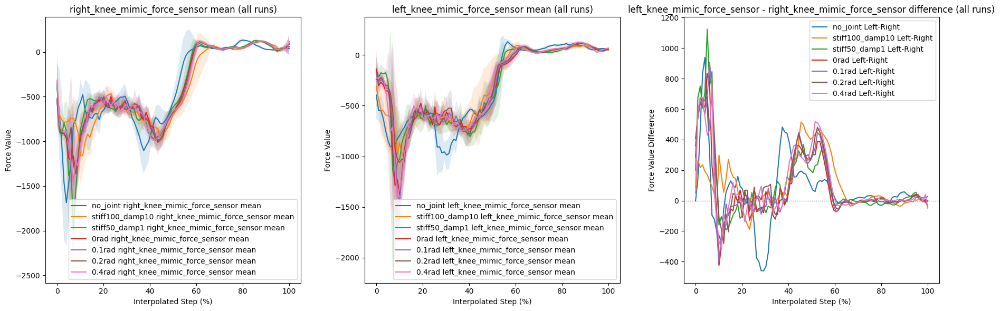

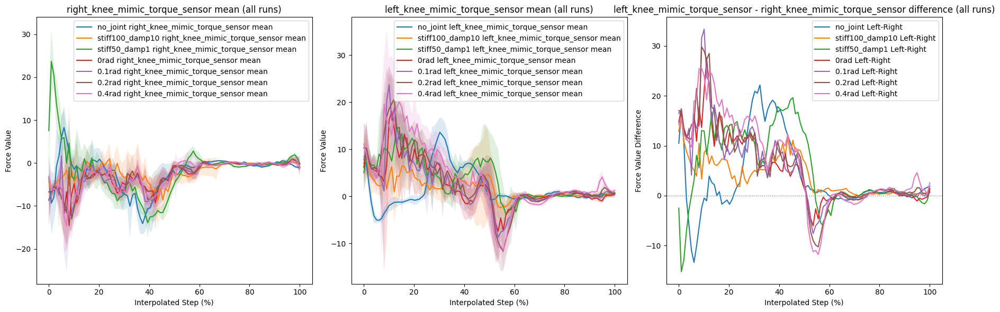

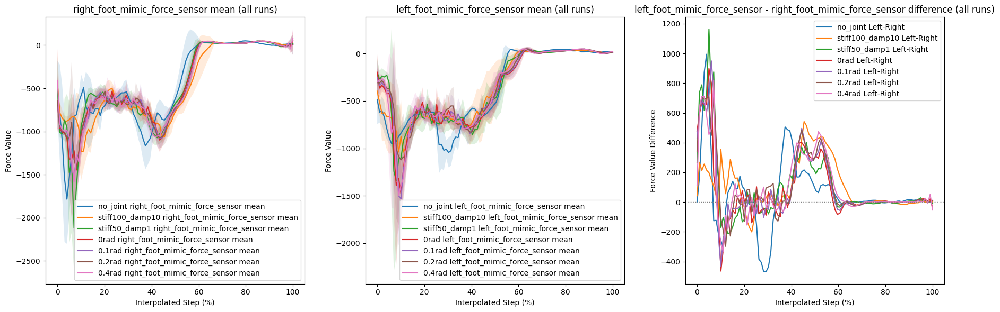

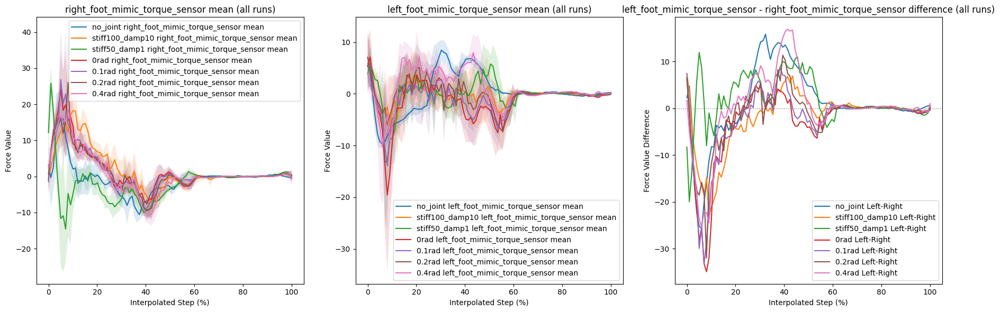

In [25]:
# def plot_sensor_force_symmetry_all_runs(all_loaded_data, run_step_data, interp_len=100, sensor_force_names=None):
#     """
#     Plot mean, std, and left-right difference for each left/right sensor force pair across all runs.
#     """
#     # Use sensor_force_names from the first run if not provided
#     if sensor_force_names is None:
#         first_run = next(iter(all_loaded_data))
#         sensor_force_names = all_loaded_data[first_run]["sensor_force_names"]

#     # Find sensor pairs (left/right)
#     sensor_pairs = []
#     for name in sensor_force_names:
#         if name.startswith("left_"):
#             right_name = name.replace("left_", "right_")
#             if right_name in sensor_force_names:
#                 sensor_pairs.append((name, right_name))

#     for left_sensor, right_sensor in sensor_pairs:
#         plt.figure(figsize=(12, 6))
#         for run_key in all_loaded_data:
#             run_dict = all_loaded_data[run_key]
#             step_data = run_step_data[run_key]
#             left_data = run_dict["all_sensor_force"][left_sensor]
#             right_data = run_dict["all_sensor_force"][right_sensor]
#             left_steps = []
#             right_steps = []
#             all_step_start_left = step_data["step_start_left"]
#             all_step_start_right = step_data["step_start_right"]

#             # Interpolate left steps
#             if all_step_start_left and len(all_step_start_left) > 1:
#                 for j in range(len(all_step_start_left) - 1):
#                     start, end = all_step_start_left[j], all_step_start_left[j + 1]
#                     y = [float(np.array(a)[1]) for a in left_data[start:end]]
#                     if len(y) < 2:
#                         continue
#                     x_old = np.linspace(0, 1, len(y))
#                     x_new = np.linspace(0, 1, interp_len)
#                     y_interp = np.interp(x_new, x_old, y)
#                     left_steps.append(y_interp)
#             # Interpolate right steps
#             if all_step_start_right and len(all_step_start_right) > 1:
#                 for j in range(len(all_step_start_right) - 1):
#                     start, end = all_step_start_right[j], all_step_start_right[j + 1]
#                     y = [float(np.array(a)[1]) for a in right_data[start:end]]
#                     if len(y) < 2:
#                         continue
#                     x_old = np.linspace(0, 1, len(y))
#                     x_new = np.linspace(0, 1, interp_len)
#                     y_interp = np.interp(x_new, x_old, y)
#                     right_steps.append(y_interp)
#             # Plot if enough steps
#             if left_steps and right_steps:
#                 mean_left = np.mean(left_steps, axis=0)
#                 std_left = np.std(left_steps, axis=0)
#                 mean_right = np.mean(right_steps, axis=0)
#                 std_right = np.std(right_steps, axis=0)
#                 diff = mean_left - mean_right
#                 x = np.linspace(0, 100, interp_len)
#                 plt.plot(x, mean_left, label=f"{run_key} {left_sensor} mean")
#                 plt.fill_between(x, mean_left - std_left, mean_left + std_left, alpha=0.15)
#                 plt.plot(x, mean_right, label=f"{run_key} {right_sensor} mean", linestyle='--')
#                 plt.fill_between(x, mean_right - std_right, mean_right + std_right, alpha=0.15)
#                 plt.plot(x, diff, label=f"{run_key} Left-Right", linestyle=':')
#         plt.axhline(0, color='gray', linestyle=':', linewidth=1)
#         plt.title(f"Force Sensor (y) per time step: {left_sensor} vs {right_sensor} (all runs)")
#         plt.xlabel("Interpolated Step (%)")
#         plt.ylabel("Force Value")
#         plt.legend()
#         plt.tight_layout()
#         plt.show()

direction = "y" # FOR FORCE USE Y ; FOR TORQUE Z HIGHEST!! #### "x" or "y" or "z"
postprocess_handler.plot_sensor_force_symmetry_all_runs(all_loaded_data, run_step_data, direction, interp_len=100)

# Force sensor: creates a 3-axis force sensor. The sensor outputs three numbers, which are the interaction 
# force between a child and a parent body, expressed in the site frame defining the sensor. The convention 
# is that the site is attached to the child body, and the force points from the child towards the parent. 
# The computation here takes into account all forces acting on the system, including contacts as well as 
# external perturbations. 

GRF 

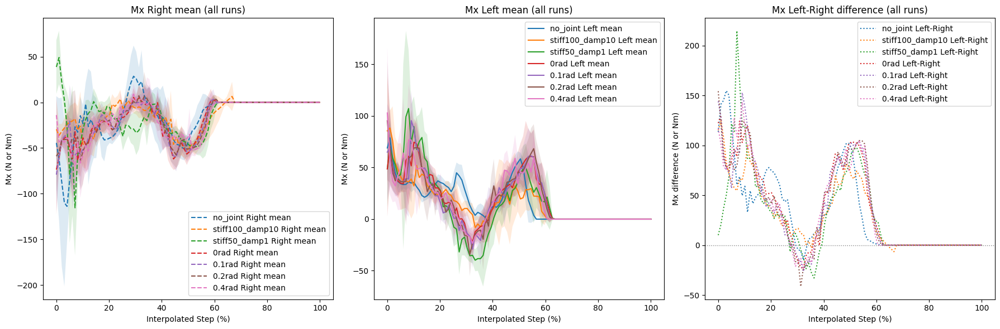

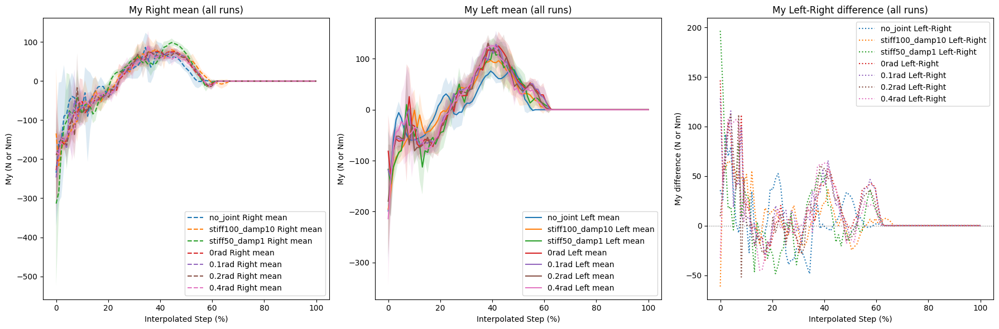

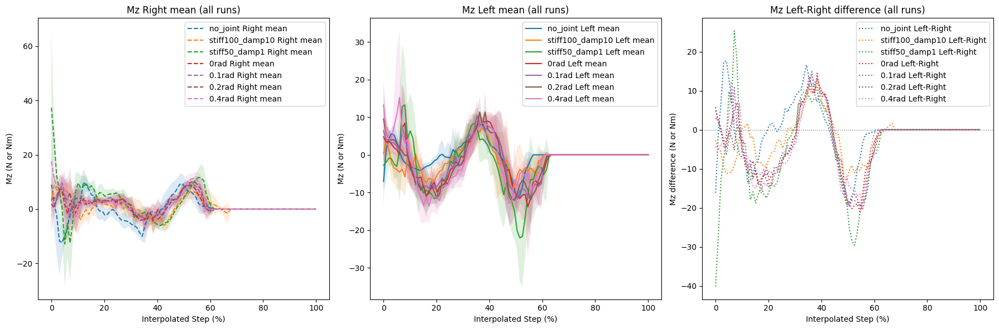

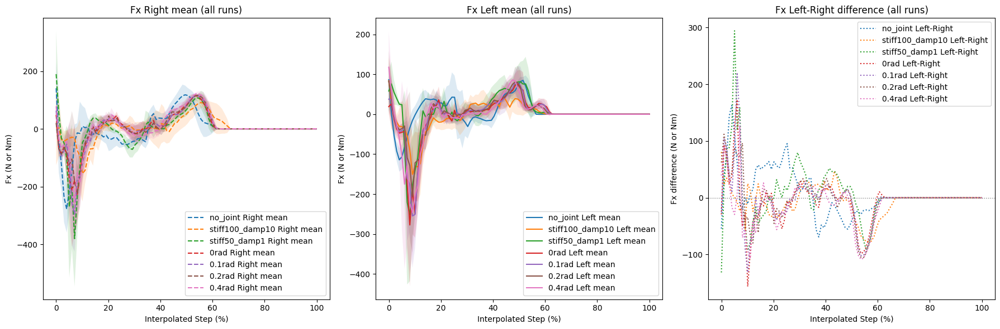

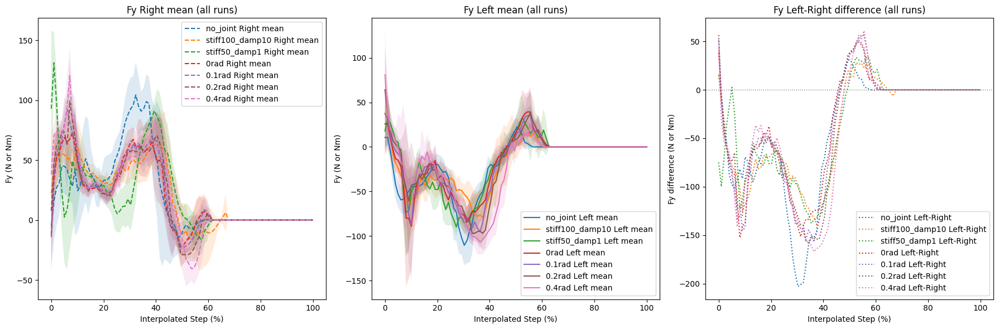

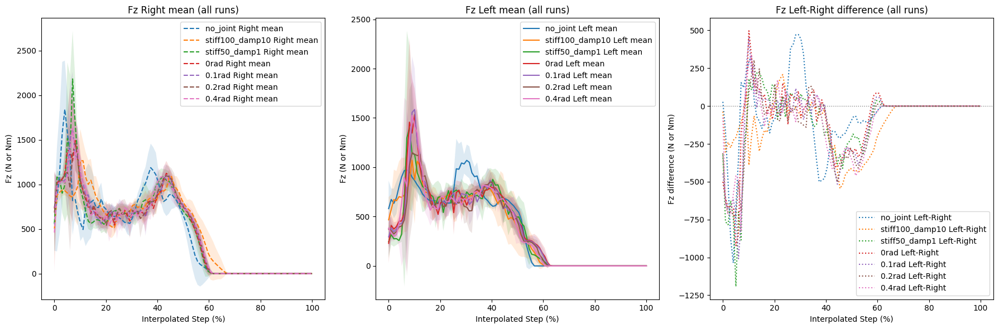

In [26]:
grf_components = ['Mx', 'My', 'Mz','Fx', 'Fy', 'Fz']  # Adjust if your GRF data has different columns
interp_len = 100

# for comp_idx, comp in enumerate(grf_components):
#     plt.figure(figsize=(12, 6))
#     for run_key in all_loaded_data:
#         run_dict = all_loaded_data[run_key]
#         step_data = run_step_data[run_key]
#         all_grf_l = np.array(run_dict["all_grf_l"])
#         all_grf_r = np.array(run_dict["all_grf_r"])
#         all_step_start_left = step_data["step_start_left"]
#         all_step_start_right = step_data["step_start_right"]

#         # Left steps
#         left_steps = []
#         if all_grf_l is not None and all_step_start_left and len(all_step_start_left) > 1:
#             for j in range(len(all_step_start_left) - 1):
#                 start, end = all_step_start_left[j], all_step_start_left[j + 1]
#                 y = [float(np.array(a)[comp_idx]) for a in all_grf_l[start:end]]
#                 if len(y) < 2:
#                     continue
#                 x_old = np.linspace(0, 1, len(y))
#                 x_new = np.linspace(0, 1, interp_len)
#                 y_interp = np.interp(x_new, x_old, y)
#                 left_steps.append(y_interp)
#         # Right steps
#         right_steps = []
#         if all_grf_r is not None and all_step_start_right and len(all_step_start_right) > 1:
#             for j in range(len(all_step_start_right) - 1):
#                 start, end = all_step_start_right[j], all_step_start_right[j + 1]
#                 y = [float(np.array(a)[comp_idx]) for a in all_grf_r[start:end]]
#                 if len(y) < 2:
#                     continue
#                 x_old = np.linspace(0, 1, len(y))
#                 x_new = np.linspace(0, 1, interp_len)
#                 y_interp = np.interp(x_new, x_old, y)
#                 right_steps.append(y_interp)
#         # Plot if enough steps
#         if left_steps and right_steps:
#             mean_left = np.mean(left_steps, axis=0)
#             std_left = np.std(left_steps, axis=0)
#             mean_right = np.mean(right_steps, axis=0)
#             std_right = np.std(right_steps, axis=0)
#             diff = mean_left - mean_right
#             x = np.linspace(0, 100, interp_len)
#             # Plot mean and std for left
#             plt.plot(x, mean_left, label=f"{run_key} Left mean", linestyle='-')
#             plt.fill_between(x, mean_left - std_left, mean_left + std_left, alpha=0.15)
#             # Plot mean and std for right
#             plt.plot(x, mean_right, label=f"{run_key} Right mean", linestyle='--')
#             plt.fill_between(x, mean_right - std_right, mean_right + std_right, alpha=0.15)
#             # Plot difference
#             plt.plot(x, diff, label=f"{run_key} Left-Right", linestyle=':')
#     plt.axhline(0, color='gray', linestyle=':', linewidth=1)
#     plt.title(f"GRF {comp}: mean, std, and difference per time step (all runs)")
#     plt.xlabel("Interpolated Step (%)")
#     plt.ylabel(f"{comp} (N or Nm)")
#     plt.legend()
#     plt.tight_layout()
#     plt.show()

postprocess_handler.plot_grf_component_symmetry_all_runs(
        grf_components,
        all_loaded_data,
        run_step_data,
        interp_len=100,
    )

Joint kinematics 

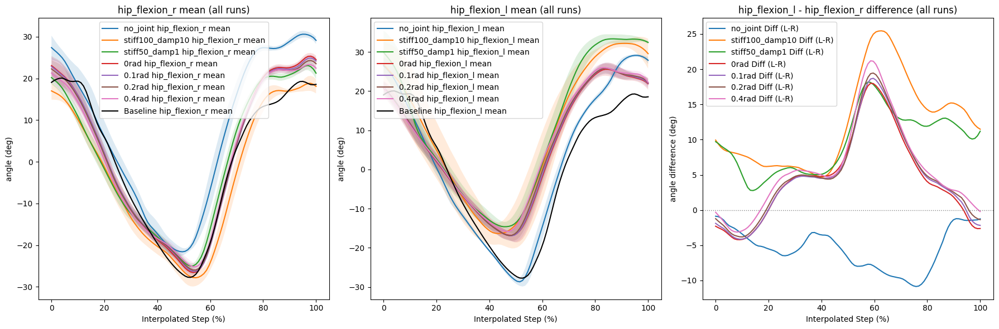

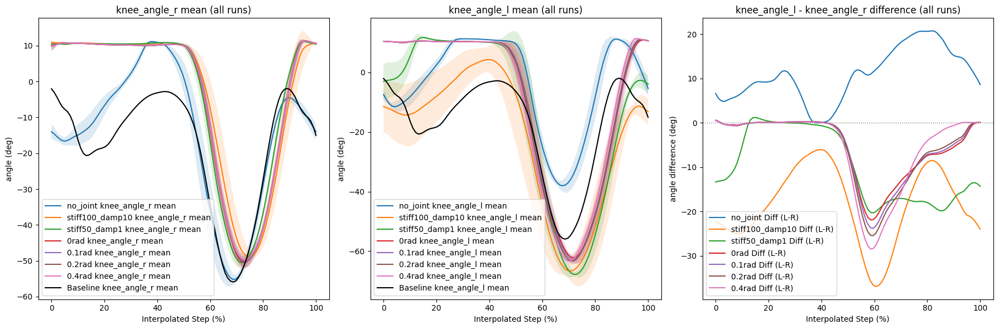

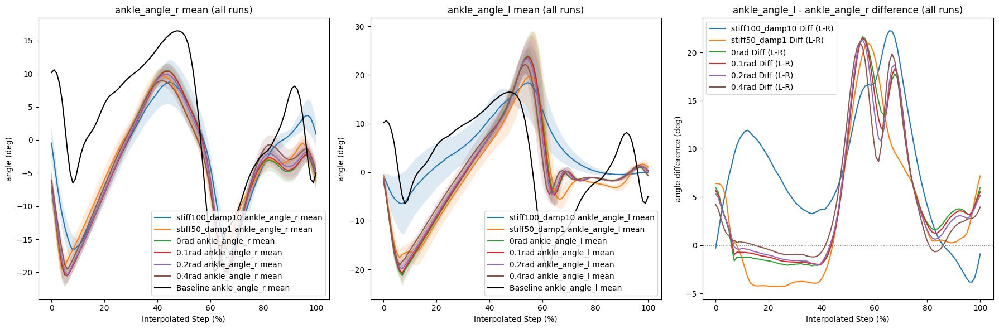

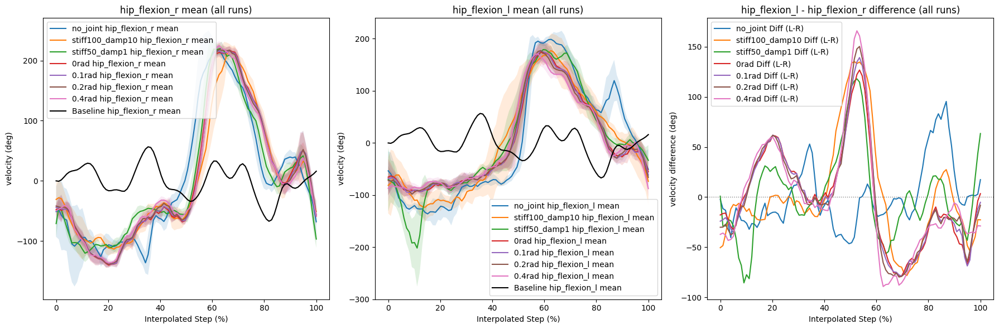

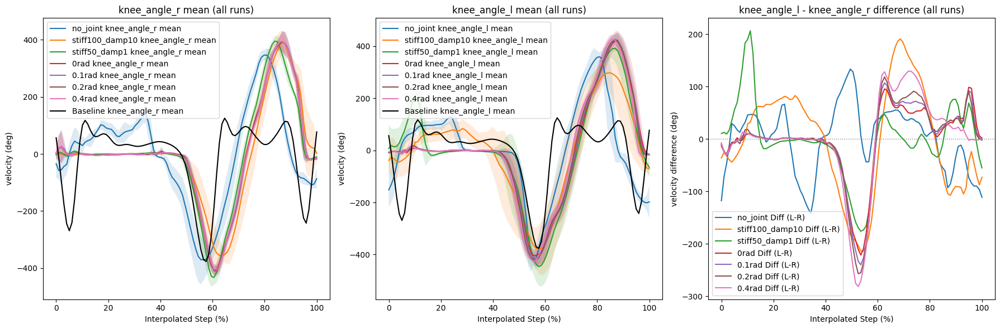

...

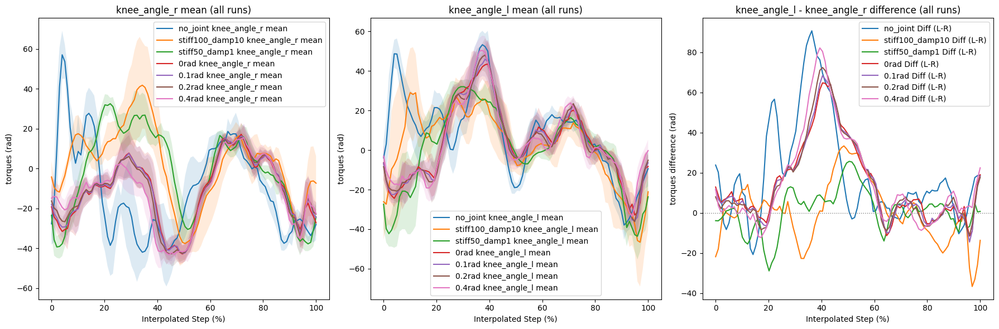

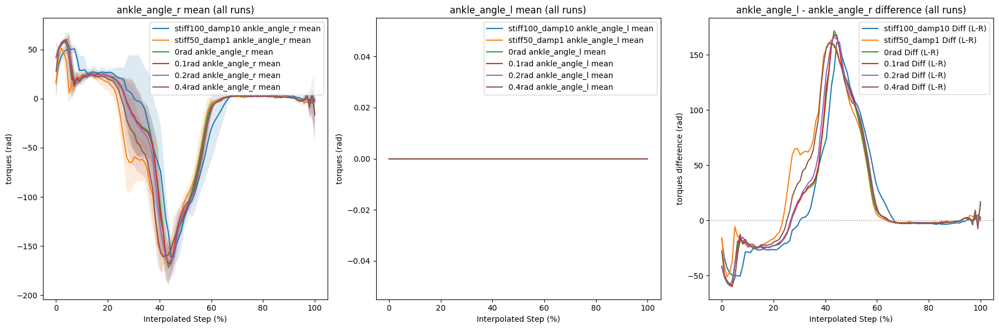

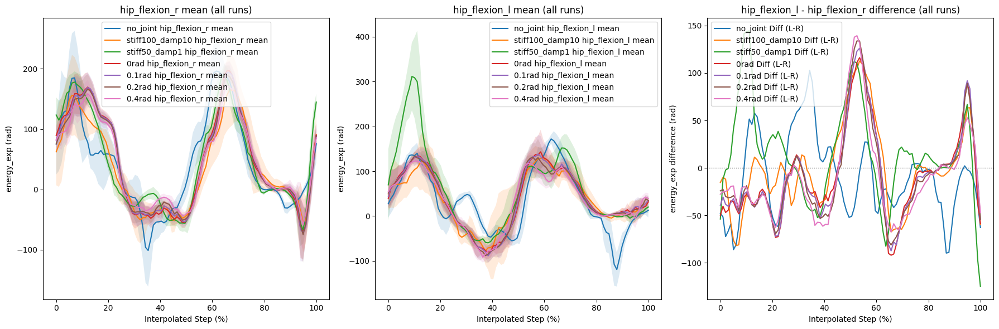

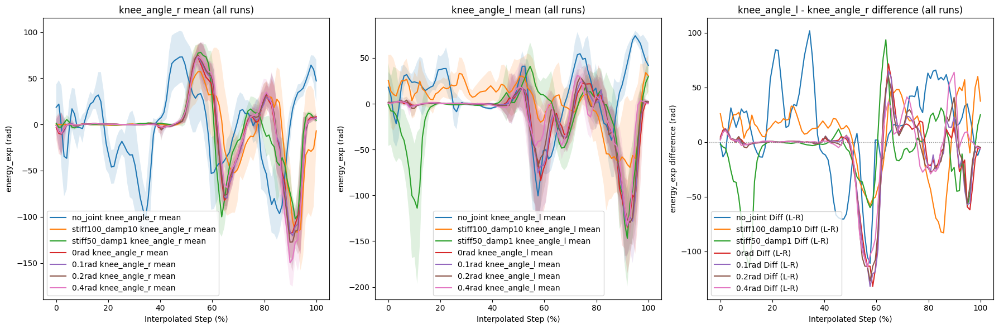

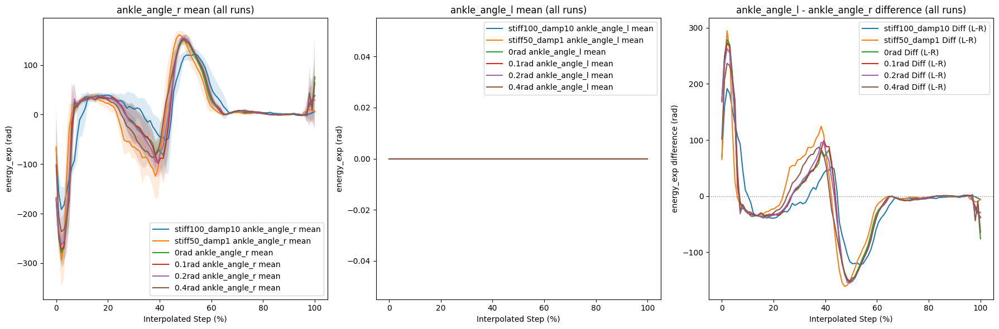

: 

In [ ]:
joint_names_list = ['hip_flexion', 'hip_rotation', 'knee_angle', 'ankle_angle', 'subtalar_angle', 'mtp_angle']  # List of joint base names
# plot angle
postprocess_handler.plot_joint_angle_symmetry_all_runs(
    joint_names_list,
    all_loaded_data,
    run_step_data,
    parameter_name="angle",
    convert_to_deg=True,
    interp_mode="interp",
    interp_len=100,
    plot_baseline=True,
    baseline_data=joint_data_baseline,
)   


# plot velocity 
postprocess_handler.plot_joint_angle_symmetry_all_runs(
    joint_names_list,
    all_loaded_data,
    run_step_data,
    parameter_name="velocity",
    convert_to_deg=True,
    interp_mode="interp",
    interp_len=100,
    plot_baseline=True,
    baseline_data=joint_data_baseline,
)

# plot forces_constraint    
postprocess_handler.plot_joint_angle_symmetry_all_runs(
    joint_names_list,
    all_loaded_data,
    run_step_data,
    parameter_name="forces_constraint",
    convert_to_deg=False,
    interp_mode="interp",
    interp_len=100,
)

# force_smooth 
postprocess_handler.plot_joint_angle_symmetry_all_runs(
    joint_names_list,
    all_loaded_data,
    run_step_data,
    parameter_name="forces_smooth",
    convert_to_deg=False,
    interp_mode="interp",
    interp_len=100,
)

# torques
postprocess_handler.plot_joint_angle_symmetry_all_runs(
    joint_names_list,
    all_loaded_data,
    run_step_data,
    parameter_name="torques",
    convert_to_deg=False,
    interp_mode="interp",
    interp_len=100,
)

postprocess_handler.plot_joint_angle_symmetry_all_runs(
    joint_names_list,
    all_loaded_data,
    run_step_data,
    parameter_name="energy_exp",
    convert_to_deg=False,
    interp_mode="interp",
    interp_len=100,
)



Muscle activation

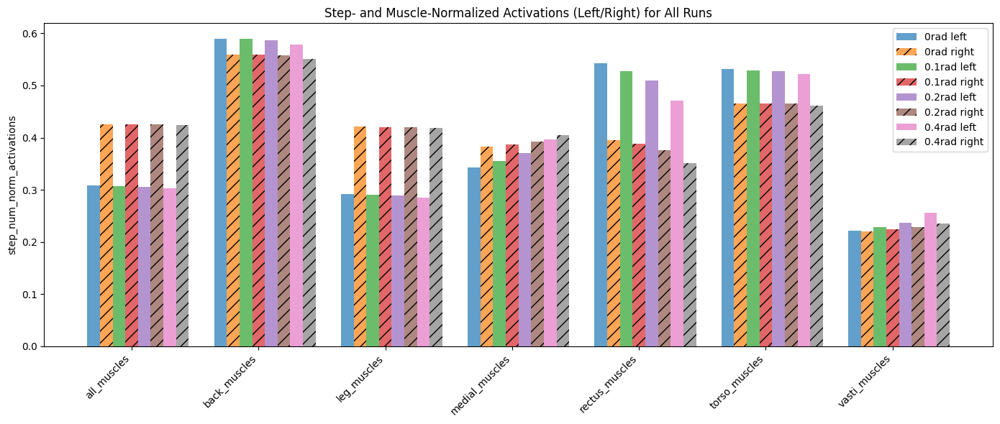

In [20]:
# Bar plot sum along all steps and muscles data for all muscles and all parameters 

all_run_keys = list(all_loaded_data.keys())
# Get all muscle groups that appear as _left/_right in any run
all_muscle_groups = set()
for run_key in all_run_keys:
    run_dict = all_loaded_data[run_key]
    act = run_dict.get("step_num_norm_activations")
    if act is not None:
        mg = list(act.keys())
        all_muscle_groups.update([g.replace('_left', '') for g in mg if g.endswith('_left') and g.replace('_left', '_right') in mg])
all_muscle_groups = sorted(all_muscle_groups)

# Bar plot for step_num_norm_activations for all runs and all muscle groups
step_num_norm_matrix = []
for run_key in all_run_keys:
    run_dict = all_loaded_data[run_key]
    act = run_dict.get("step_num_norm_activations")
    vals = []
    for base in all_muscle_groups:
        left = act.get(f"{base}_left") if act else None
        right = act.get(f"{base}_right") if act else None
        # Convert to scalar
        if isinstance(left, tuple):
            left = left[0]
        if hasattr(left, "item"):
            left = left.item()
        if isinstance(right, tuple):
            right = right[0]
        if hasattr(right, "item"):
            right = right.item()
        # Plot both left and right
        vals.append(left if left is not None else np.nan)
        vals.append(right if right is not None else np.nan)
    step_num_norm_matrix.append(vals)

step_num_norm_matrix = np.array(step_num_norm_matrix)  # shape: (n_runs, 2*n_groups)
bar_width = 0.2
x = np.arange(len(all_muscle_groups))
plt.figure(figsize=(14, 6))
for i, run_key in enumerate(all_run_keys):
    left_vals = step_num_norm_matrix[i, 0::2]
    right_vals = step_num_norm_matrix[i, 1::2]
    plt.bar(x + i * bar_width, left_vals, width=bar_width/2, label=f"{run_key} left", alpha=0.7)
    plt.bar(x + i * bar_width + bar_width/2, right_vals, width=bar_width/2, label=f"{run_key} right", alpha=0.7, hatch='//')
plt.xticks(x + bar_width * (len(all_run_keys)-1)/2, all_muscle_groups, rotation=45, ha='right')
plt.ylabel("step_num_norm_activations")
plt.title("Step- and Muscle-Normalized Activations (Left/Right) for All Runs")
plt.legend()
plt.tight_layout()
plt.show()
plt.close()


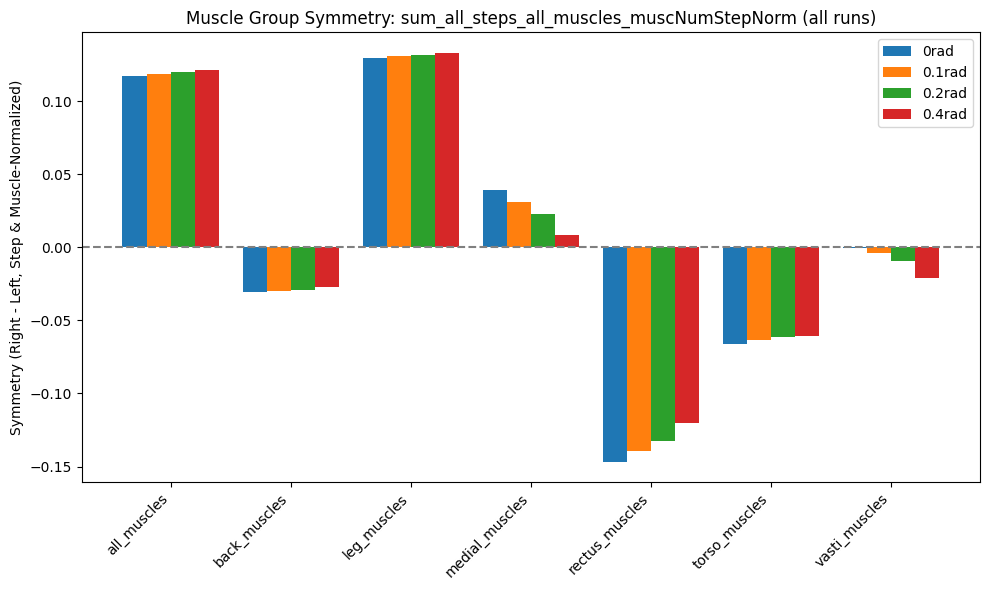

In [21]:
# Muscle activation symmetry (right - left) for each muscle group, for all runs, side-by-side bars
all_run_keys = list(all_loaded_data.keys())
# Get all muscle groups that appear as _left/_right in any run
all_muscle_groups = set()
for run_key in all_run_keys:
    run_dict = all_loaded_data[run_key]
    act = run_dict.get("step_num_norm_activations")
    if act is not None:
        mg = list(act.keys())
        all_muscle_groups.update([g.replace('_left', '') for g in mg if g.endswith('_left') and g.replace('_left', '_right') in mg])
all_muscle_groups = sorted(all_muscle_groups)

# Collect symmetry values for each run
symmetry_matrix = []
for run_key in all_run_keys:
    run_dict = all_loaded_data[run_key]
    act = run_dict.get("step_num_norm_activations")
    vals = []
    for base in all_muscle_groups:
        left = act.get(f"{base}_left") if act else None
        right = act.get(f"{base}_right") if act else None
        # Convert to scalar
        if isinstance(left, tuple):
            left = left[0]
        if hasattr(left, "item"):
            left = left.item()
        if isinstance(right, tuple):
            right = right[0]
        if hasattr(right, "item"):
            right = right.item()
        if left is not None and right is not None:
            vals.append(right - left)
        else:
            vals.append(np.nan)
    symmetry_matrix.append(vals)

symmetry_matrix = np.array(symmetry_matrix)  # shape: (n_runs, n_groups)

# Plot side-by-side bars
bar_width = 0.2
x = np.arange(len(all_muscle_groups))
plt.figure(figsize=(10, 6))
for i, run_key in enumerate(all_run_keys):
    plt.bar(x + i * bar_width, symmetry_matrix[i], width=bar_width, label=run_key)
plt.axhline(0, color='gray', linestyle='--')
plt.xticks(x + bar_width * (len(all_run_keys)-1)/2, all_muscle_groups, rotation=45, ha='right')
plt.ylabel("Symmetry (Right - Left, Step & Muscle-Normalized)")
plt.title("Muscle Group Symmetry: sum_all_steps_all_muscles_muscNumStepNorm (all runs)")
plt.legend()
plt.tight_layout()
plt.show()
plt.close()

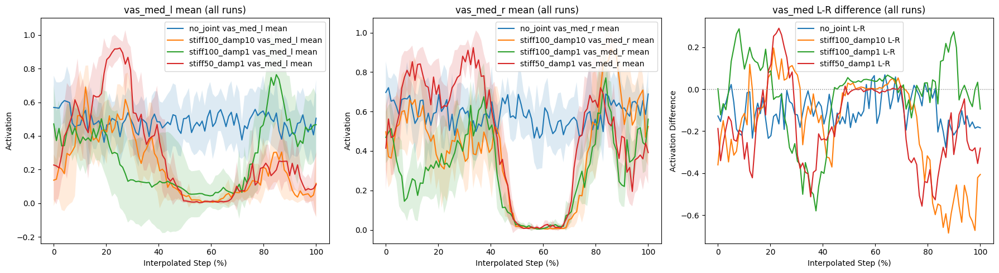

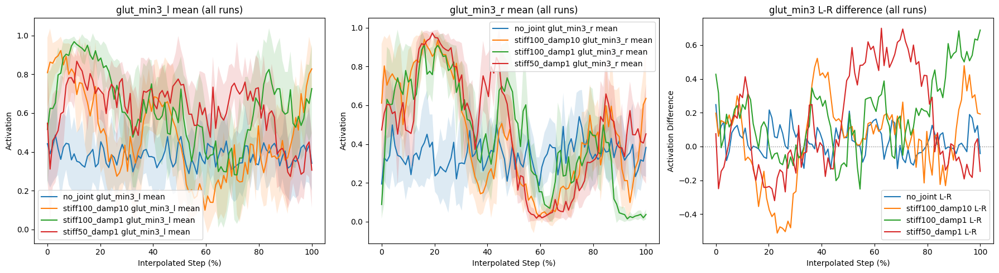

In [ ]:
muscle_names_list = ['vas_med', 'glut_min3']  # List of muscle base names to plot
postprocess_handler.plot_muscle_activation_symmetry_all_runs(
    muscle_names_list,
    all_loaded_data,
    run_step_data,
    interp_len=100,
)


# Pertubation forces

Loaded data: dict_keys([0, 10, 20, 30, 40, 50, 60, 70, 80, 90, 100, 110, 120, 130, 140, 150, 160, 170, 180, 190, 200, 210, 220, 230, 240, 250, 260, 270, 280, 290, 300])


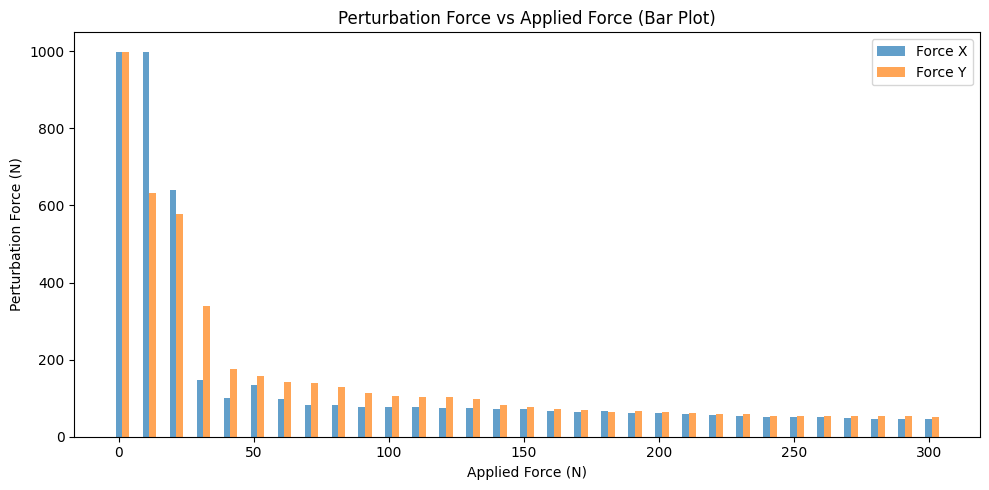

In [ ]:
# One Run 
perturb_path = "/home/nadinebadie/loco-mujoco/prosthesis_test/outputs/2025-06-07/02-31-13/20250617_003316_perturbation_force_time.pkl"


with open(perturb_path, "rb") as f:
    perturb_data = pickle.load(f)
    print(f"Loaded data: {perturb_data.keys()}")  # Print the keys of the loaded data to verify

force_min = 0 
force_max = 301 
force_increment = 10
force_direction = ['x', 'y']  #, 'z']  # Specify the force directions you want to plot
force_range = np.arange(force_min, force_max, force_increment)  


force_sort = {}
# Collect force values for each direction over the force_range
for d in force_direction: #, 'z']:
    force_sort[d] = [perturb_data[f][d] if f in perturb_data and d in perturb_data[f] else np.nan for f in force_range]

# Plot the perturbation forces for each direction as bar plots
plt.figure(figsize=(10, 5))
bar_width = 2.5  # width of each bar

for idx, (d, label, color) in enumerate(zip(force_direction, ['Force X', 'Force Y', 'Force Z'], ['tab:blue', 'tab:orange', 'tab:green'])):
    plt.bar(force_range + idx * bar_width, force_sort[d], width=bar_width, label=label, alpha=0.7, color=color)

plt.xlabel("Applied Force (N)")
plt.ylabel("Steps until Fall")
plt.title("Perturbation Force vs Steps until Fall")
plt.legend()
plt.tight_layout()
plt.show()
plt.close()


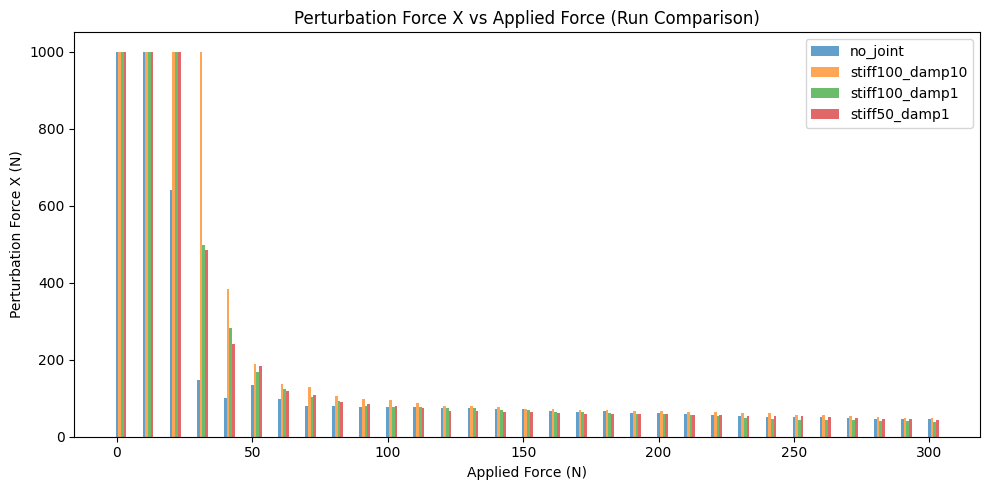

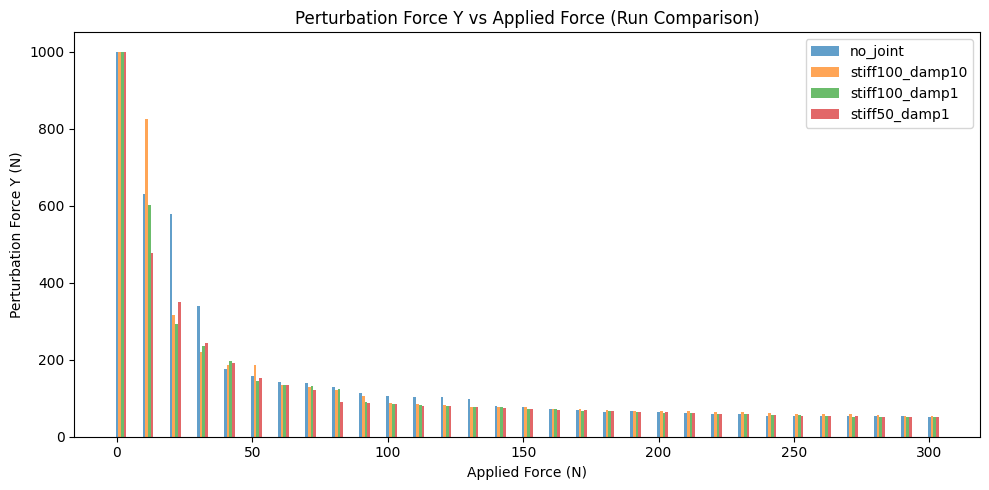

In [ ]:
# print("Loading perturbation data...")
perturb_file = {}

# Fix missing comma in perturb_path
perturb_path = {
    'no_joint': "/home/nadinebadie/loco-mujoco/prosthesis_test/outputs/2025-06-07/02-31-13/20250617_003316_perturbation_force_time.pkl",
    'stiff100_damp10': "/home/nadinebadie/loco-mujoco/prosthesis_test/outputs/2025-06-10/02-14-59/20250617_104629_perturbation_force_time_seed0.pkl",
    'stiff100_damp1': "/home/nadinebadie/loco-mujoco/prosthesis_test/outputs/2025-06-10/19-06-15/20250617_014911_perturbation_force_time.pkl", 
    'stiff50_damp1': "/home/nadinebadie/loco-mujoco/prosthesis_test/outputs/2025-06-11/16-30-59/20250617_015022_perturbation_force_time.pkl"
}

# print("Perturb_path", perturb_path)

for run_name, path in perturb_path.items():
    # print(f"Loading data for {run_name} from {path}")
    with open(path, "rb") as f:
        perturb_file[run_name] = pickle.load(f)
    # print(f"Loaded data for {run_name}: {perturb_file[run_name].keys()}")  # Print the keys of the loaded data to verify

force_min = 0 
force_max = 301 
force_increment = 10
force_range = np.arange(force_min, force_max, force_increment)  

# Plot all x for all runs in one plot
plt.figure(figsize=(10, 5))
bar_width = 1  # width of each bar
colors = ['tab:blue', 'tab:orange', 'tab:green', 'tab:red']  # Define colors for each run

for idx, (run_name, color) in enumerate(zip(perturb_file.keys(), colors)):
    perturb_data = perturb_file[run_name]
    force_x = [perturb_data[f]['x'] if f in perturb_data and 'x' in perturb_data[f] else np.nan for f in force_range]
    plt.bar(force_range + idx * bar_width, force_x, width=bar_width, label=run_name, alpha=0.7, color=color)

plt.xlabel("Applied Force (N)")
plt.ylabel("Perturbation Force X (N)")
plt.title("Perturbation Force X vs Applied Force (Run Comparison)")
plt.legend()
plt.tight_layout()
plt.savefig("/home/nadinebadie/loco-mujoco/prosthesis_test/perturbation_force_comparison_x.png")
plt.show()

# Plot all y for all runs in a second plot
plt.figure(figsize=(10, 5))

for idx, (run_name, color) in enumerate(zip(perturb_file.keys(), colors)):
    perturb_data = perturb_file[run_name]
    force_y = [perturb_data[f]['y'] if f in perturb_data and 'y' in perturb_data[f] else np.nan for f in force_range]
    plt.bar(force_range + idx * bar_width, force_y, width=bar_width, label=run_name, alpha=0.7, color=color)

plt.xlabel("Applied Force (N)")
plt.ylabel("Steps until Fall")
plt.title("Perturbation Force Y vs Steps until Fall")
plt.legend()
plt.tight_layout()
plt.savefig("/home/nadinebadie/loco-mujoco/prosthesis_test/perturbation_force_comparison_y.png")
plt.show()
plt.close()